In [1]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
import torch.nn as nn
import torch
import warnings

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device in use ", device)

Device in use  cuda


(2771, 2250, 3)


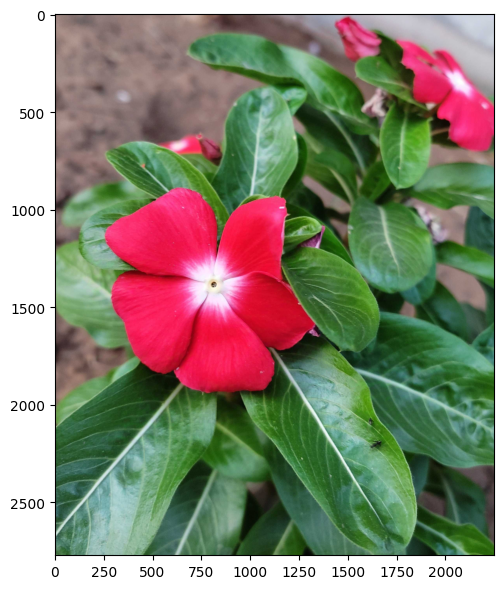

In [2]:

# Reading the image.
image = plt.imread('Periwinkle.jpg')

# Create a copy of the image.
image_copy = image.copy()

# Display the image
print(image_copy.shape)
plt.figure(figsize=(8, 6))
plt.imshow(image_copy)
plt.tight_layout()
plt.show()

(1500, 1275, 3)


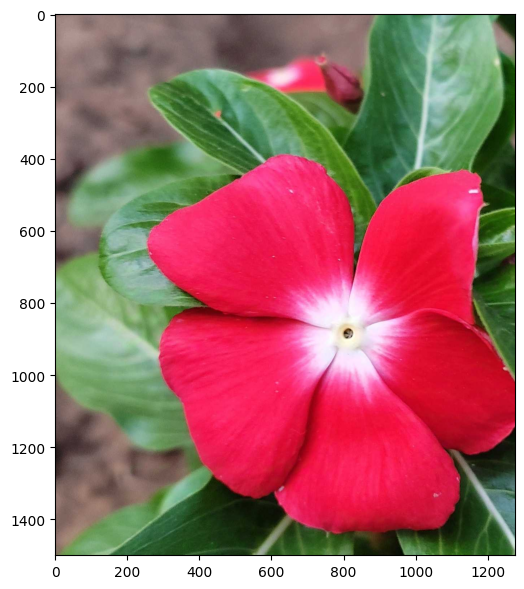

In [3]:
# Cropping the image to take particular details.

cropped = image[500:2000, 0:1275]
print(cropped.shape)
plt.figure(figsize=(8, 6))
plt.imshow(cropped)
plt.tight_layout()
plt.show()

(300, 300, 3)


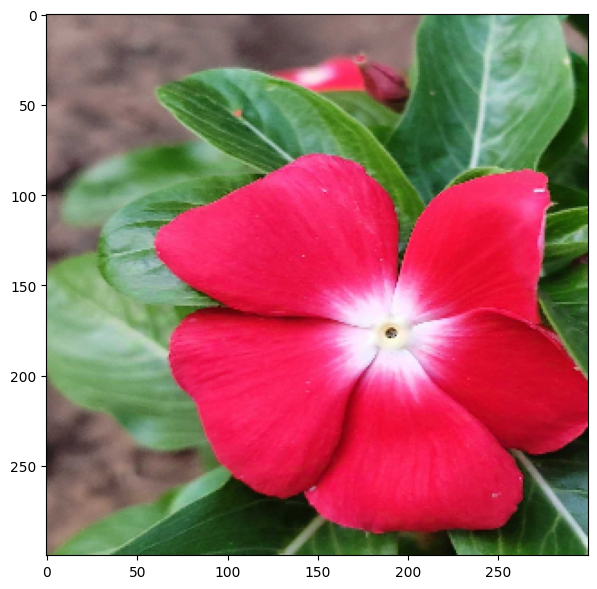

In [4]:
# Normalizing the image to be in a range [0,1]
cropped = cropped/255.0
#cropped
# Resizing image to make it easy and small to compute.
resized = cv.resize(cropped, (300, 300))

print(resized.shape)
plt.figure(figsize=(8, 6))
plt.imshow(resized)
plt.tight_layout()
plt.show()

mod_im = resized

In [5]:
# Creating the 2D grid of the image.
height, width, channels = mod_im.shape

x_coord = range(width)
y_coord = range(height)

x_val, y_val = np.meshgrid(x_coord, y_coord)

x_val = x_val.flatten()
y_val = y_val.flatten()

X = np.vstack((y_val, x_val)).T
y = mod_im.reshape(height* width, 3)

In [6]:

class MLP_Relu(nn.Module):
    def __init__(self,layer_sizes):
        super().__init__()

        self.layers= nn.ModuleList()
        for idx in range(1,len(layer_sizes)):
            self.layers.append(nn.Linear(layer_sizes[idx-1],layer_sizes[idx]))

    def forward(self,x):
        for layer in self.layers[:-1]:
            x = torch.nn.functional.relu(layer(x))
        return self.layers[-1](x)


## Trainer and image plot.
def train(X, y, model, lr = 0.01, epochs = 100, bs = 1000, print_every = 20,verbose=True):
    losses = []
    imgs = []
    optimizer = torch.optim.Adam(model.parameters(), lr = lr)
    criterion = nn.MSELoss()
    for epoch in range(epochs):
        optimizer.zero_grad()
        # choosing some random indexes to train the model.
        index = np.random.choice(X.shape[0],bs)
        X_batch = torch.tensor(X[index], dtype = torch.float32).to(device)
        y_batch = torch.tensor(y[index], dtype = torch.float32).to(device)
        y_pred = model(X_batch)
        loss = criterion(y_pred, y_batch)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
        if verbose:
            if epoch % print_every ==0:
                print(f'Epoch {epoch}, Loss: {loss.item()}')
                imgs.append(model(torch.tensor(X, dtype=torch.float32).to(device)).detach().cpu().numpy())
    return losses, imgs


# Plotting the image.
def plot_images(model,X, name = None):
    # predicting the r,g,b values
    #pred_y = model(torch.tensor(X, dtype=torch.float32)).to(device)
    pred_y = model(torch.tensor(X, dtype=torch.float32).to(device))
    # Reshaping to have predictions as (channel,height, width)
    pred_y = pred_y.transpose(0,1).reshape(channels, height, width)

    # plotting the image.
    plt.imshow(pred_y.permute(1, 2, 0).detach().cpu())
    # if name:
    #     plt.savefig(name)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.33787343..1.2593904].


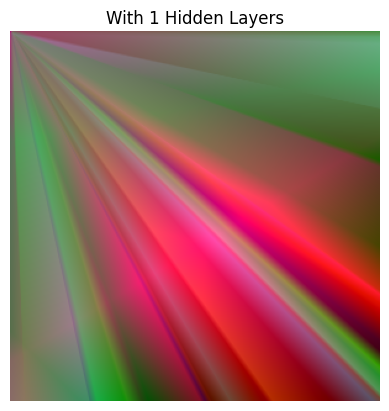

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13984153..1.1581597].


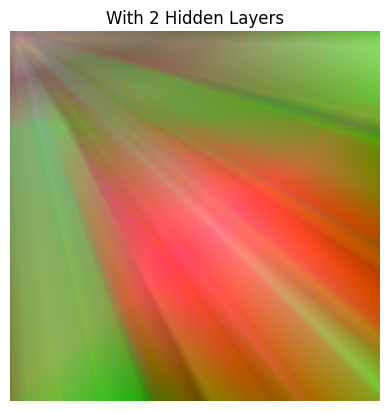

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036130488..1.2732728].


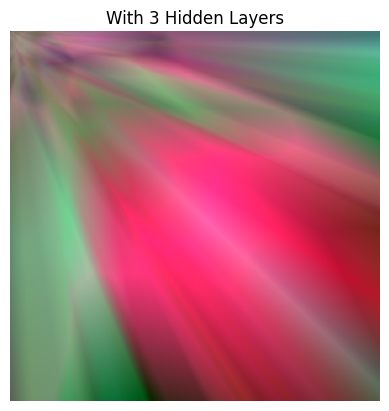

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.117149994..1.2018126].


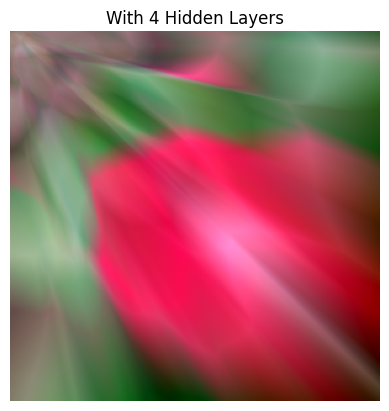

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.101999715..1.1283216].


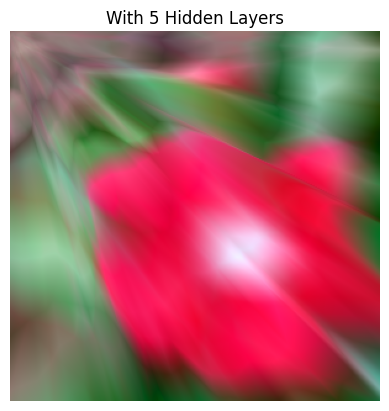

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08269581..1.1935042].


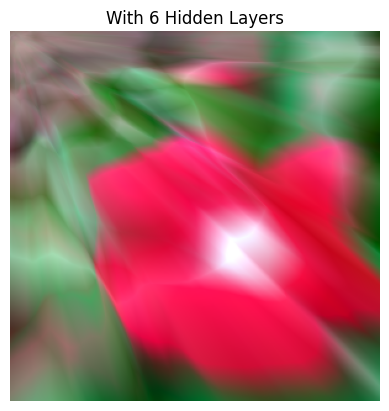

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13310236..1.1534].


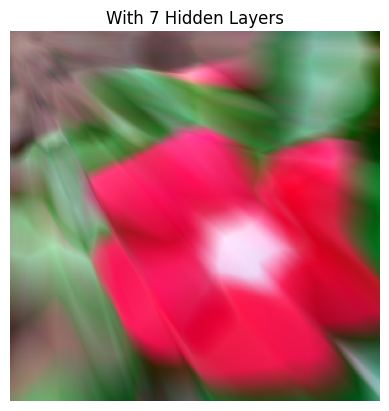

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023531983..1.1349314].


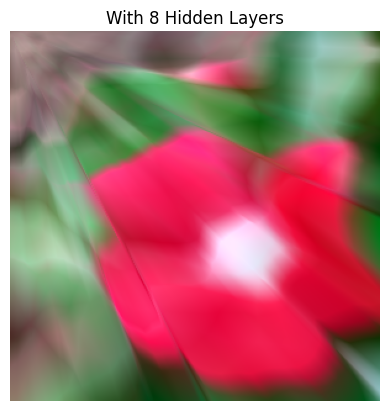

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.069297515..1.20953].


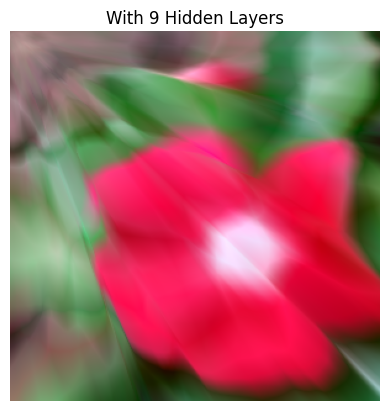

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.051188383..1.1854781].


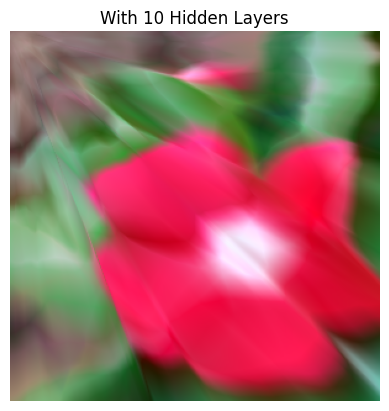

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047728047..1.0977883].


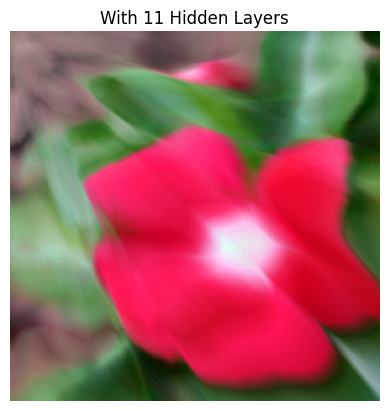

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045496..1.0969875].


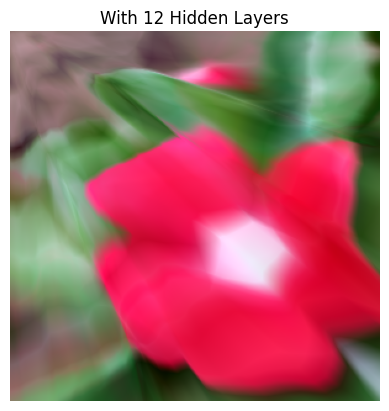

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13046777..1.1262666].


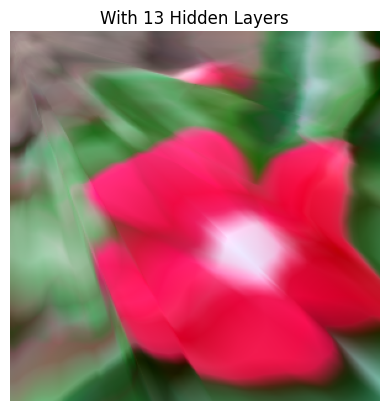

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06755391..1.1388448].


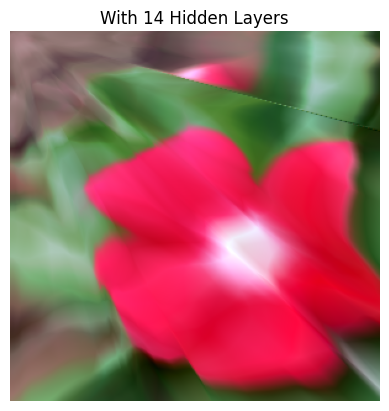

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09380598..1.0853198].


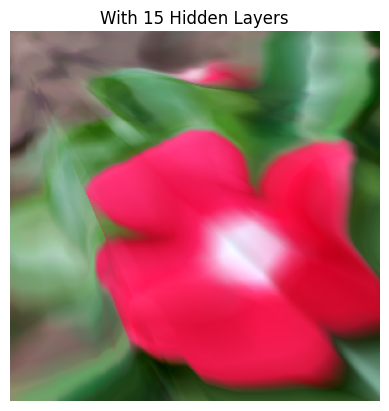

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.018889122..1.1210393].


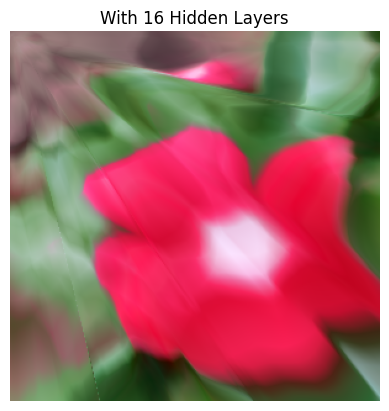

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03103184..1.0593725].


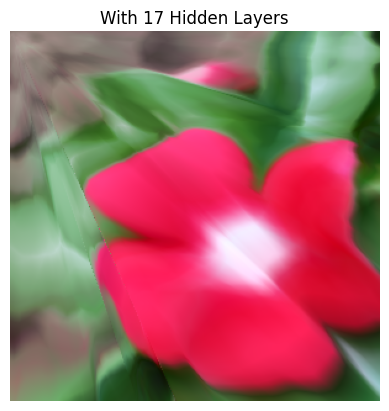

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015600316..1.0684165].


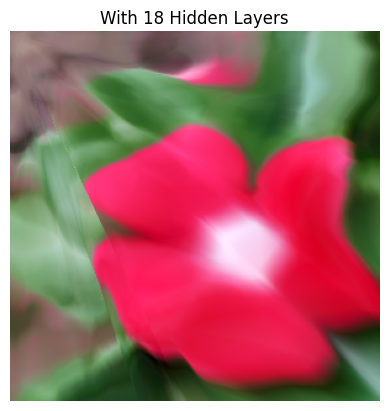

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0045611784..1.0211544].


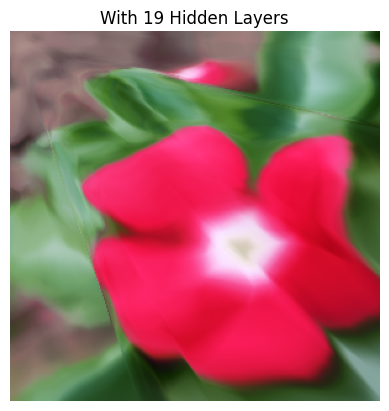

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03752233..1.0781018].


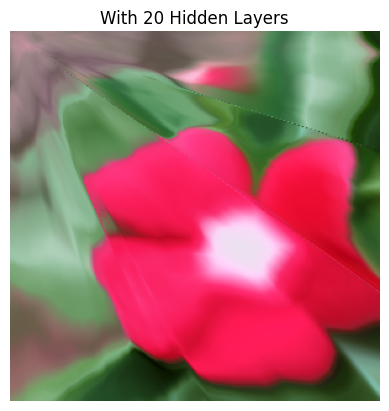

In [7]:
mses_complexity = []

for n_hidden in range(1,21):
    hidder_layers = n_hidden*[64]
    layer_size = [2] + hidder_layers +[3]
    
    relu_model = MLP_Relu(layer_size)
    relu_model.to(device)

    # Model Training
    l,_ = train(X,y,relu_model,lr=0.001, epochs=5000, bs=5000, verbose=False)

    # Predict Image
    pred_y = relu_model(torch.tensor(X, dtype=torch.float32).to(device))
    pred_image = pred_y.transpose(0,1).reshape(channels,height, width).permute(1,2,0).detach().cpu().numpy()
    plt.imshow(pred_image)
    plt.title("With "+str(n_hidden)+" Hidden Layers")
    plt.axis("off")
    plt.show()

    # Test_rmse
    mse = np.mean((resized - pred_image)**2)
    mses_complexity.append(mse)


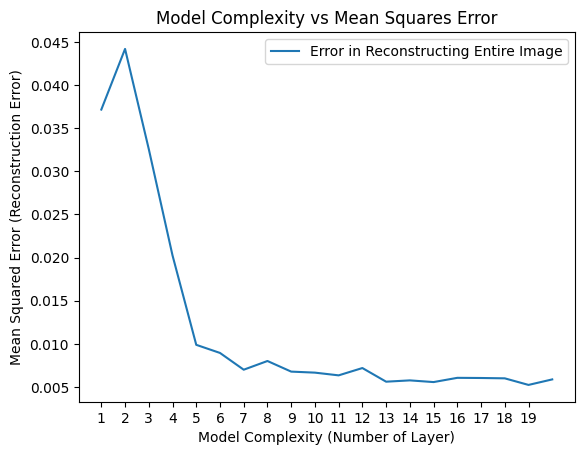

In [8]:
plt.plot(range(1,21),mses_complexity,label = "Error in Reconstructing Entire Image")
plt.xlabel("Model Complexity (Number of Layer)")
plt.ylabel("Mean Squared Error (Reconstruction Error)")
plt.title("Model Complexity vs Mean Squares Error")
plt.legend()
plt.xticks(range(1,20))
plt.show()

In [9]:
class MLP_relu(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(2,    128)
        self.fc2 = nn.Linear(128,  256)
        self.fc3 = nn.Linear(256,  512)
        self.fc4 = nn.Linear(512,  1024)
        self.fc5 = nn.Linear(1024, 512)
        self.fc6 = nn.Linear(512,  256)
        self.fc7 = nn.Linear(256,  128)
        self.fc8 = nn.Linear(128,  3)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = torch.relu(self.fc4(x))
        x = torch.relu(self.fc5(x))
        x = torch.relu(self.fc6(x))
        x = torch.relu(self.fc7(x))
        return self.fc8(x)
    
def get_index(X,ratio=0.9):
    idx = np.random.choice(len(X),int(ratio*len(X)),replace=False)
    return idx

def train_with_missing_data(model,X,y,ratio,lr=0.001,epochs=5000,bs=1000,print_every=250):

    idxs = get_index(X,ratio)
    loss,_= train(X[idxs],y[idxs],model,lr=lr,epochs=epochs,bs=bs,verbose=False)

    image = np.zeros(shape=(300,300,3))
    image[X[idxs][:,0],X[idxs][:,1]] =  y[idxs]

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Original Image with '+str(int(100*(1-ratio)))+"% Missing pixels values")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plot_images(model,X)
    plt.title('Reconstructed Image after training')
    plt.axis('off')
    plt.show()

    return loss[-1]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043664224..1.0924631].


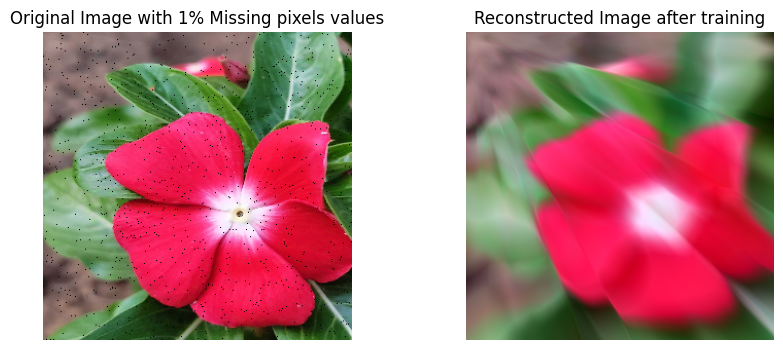

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0042930655..1.0787698].


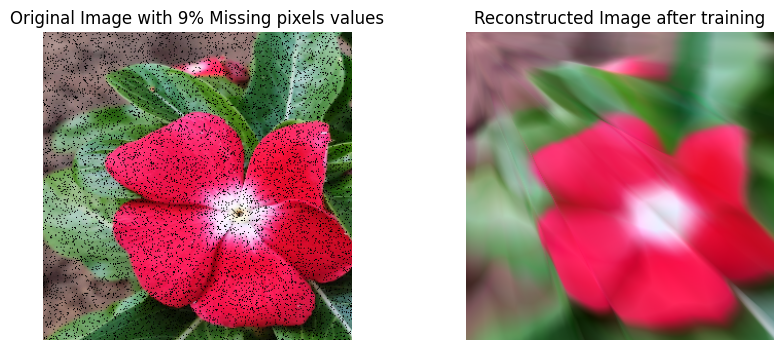

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007943442..1.0705503].


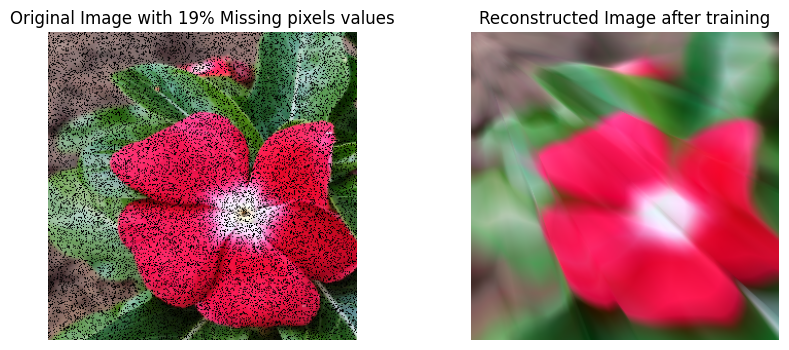

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010465238..1.0871291].


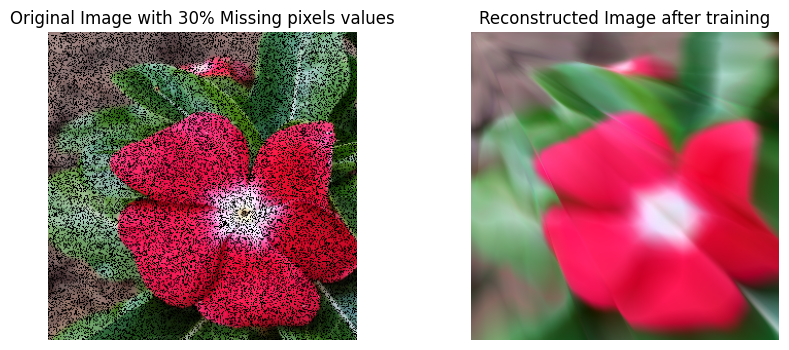

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0008865632..1.0839707].


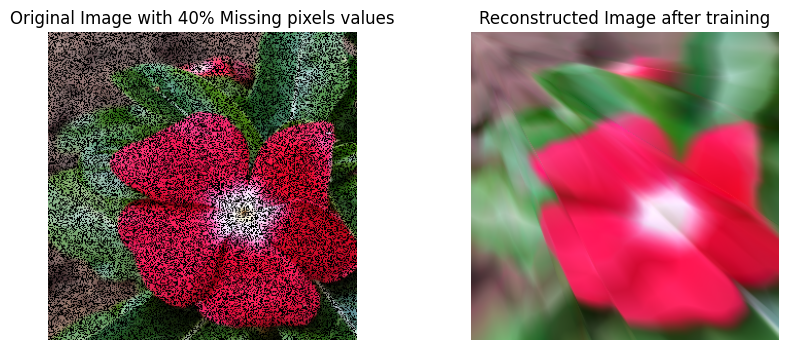

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.028323762..1.0688077].


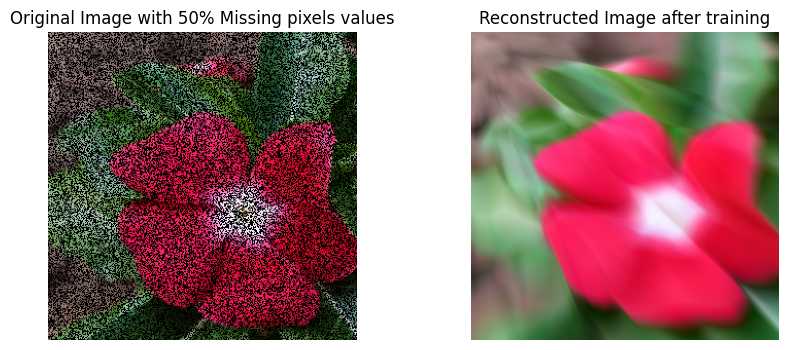

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00906699..1.1062086].


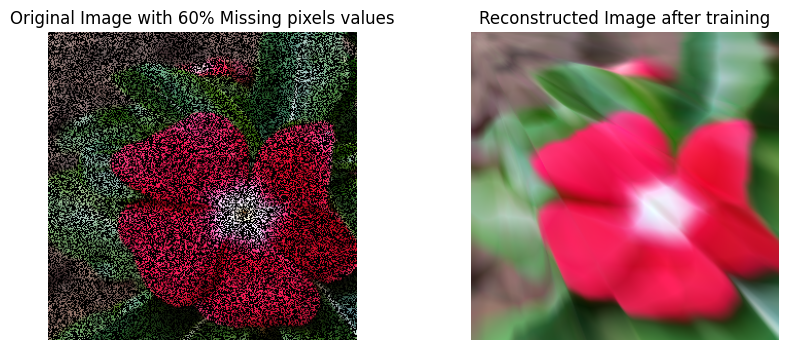

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024545465..1.0680916].


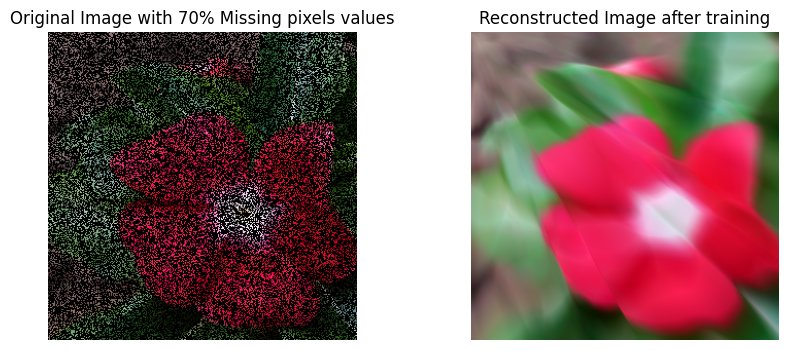

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.039377958..1.1426288].


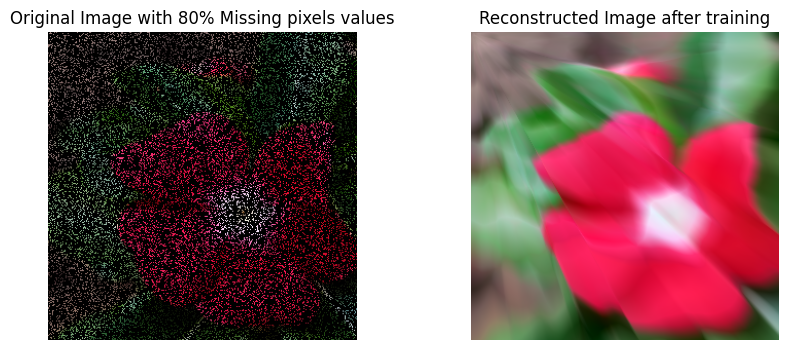

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045199346..1.0934407].


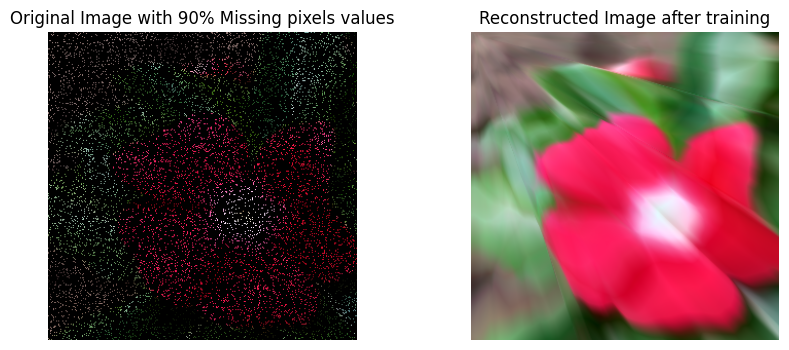

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0397881..1.2973012].


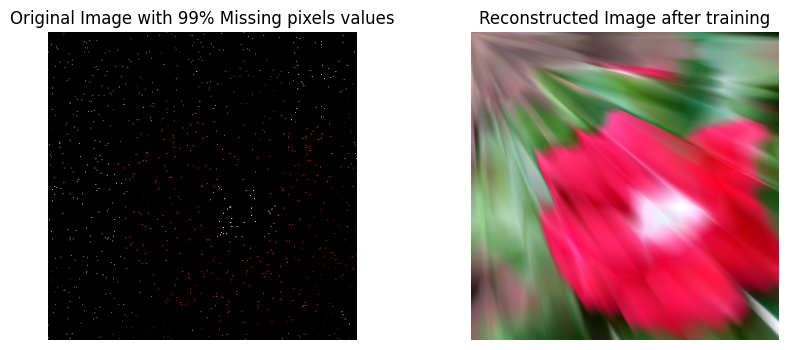

In [10]:
pixel_ratios = [0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.99]

mses_missing_data = []
loss_missing_data = []

for ratio in pixel_ratios:
    model_relu = MLP_relu()
    model_relu.to(device)

    l=train_with_missing_data(model_relu,X,y,ratio=1-ratio,print_every=1000)

    pred_y = model_relu(torch.tensor(X, dtype=torch.float32).to(device))
    pred_image = pred_y.transpose(0,1).reshape(channels,height, width).permute(1,2,0).detach().cpu().numpy()

    # Test_rmse
    mse = np.mean((resized - pred_image)**2)
    mses_missing_data.append(mse)
    loss_missing_data.append(l)

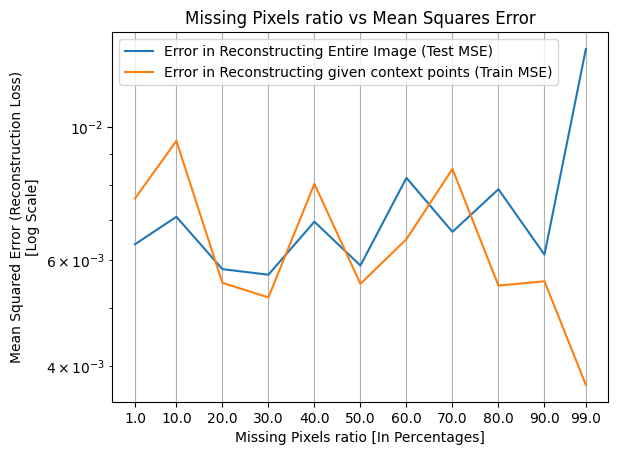

In [11]:
plt.plot(pixel_ratios,mses_missing_data,label = "Error in Reconstructing Entire Image (Test MSE)")
plt.plot(pixel_ratios,loss_missing_data, label = "Error in Reconstructing given context points (Train MSE)")
plt.xticks(pixel_ratios,np.array(pixel_ratios)*100)
plt.xlabel("Missing Pixels ratio [In Percentages]")
plt.ylabel("Mean Squared Error (Reconstruction Loss)\n[Log Scale]")
plt.title("Missing Pixels ratio vs Mean Squares Error")
plt.yscale('log') 
plt.grid(axis='x')
plt.legend()
plt.show()